In [1]:
# Import standard libraries for deep learning, metrics, image processing, and multiprocessing
import os
import copy
import torch
import torch.nn as nn
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, Subset, DistributedSampler, SubsetRandomSampler
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import torchvision.transforms as transforms

In [2]:
# Custom dataset class for loading jet images and their labels
class JetImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir # Directory where images are stored
        self.transform = transform # Image transformations to be applied
        self.images = []  # List to hold image filenames
        self.labels = []  # List to hold labels

        # Traverse the directory and label each image as gluon (0) or quark (1)
        for filename in os.listdir(root_dir):
            if filename.endswith(".png"):
                for i in range(5):
                    if f"type{i}" in filename:
                        label = i
                        self.images.append(filename)
                        self.labels.append(label)
                        break

    def __len__(self):
        return len(self.images) # Total number of images

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.images[idx]) # Construct full path to image
        image = Image.open(img_path).convert("RGB")  # The images are converted to RGB format

        if self.transform:
            image = self.transform(image) # Apply transformations (resize, normalize, etc.)

        label = self.labels[idx] # Get corresponding label
        return image, label # Return processed image and its label
    
# Function to load the dataset and split it into training/validation and testing sets
def load_jet_images(data_dir, img_size=299, seed=70):
    # Define preprocessing transformations for images
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)), # Resize image
        transforms.ToTensor(), # Convert image to tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # Normalize with ImageNet stats
        #transforms.Lambda(lambda x: x.expand(3, -1, -1)),
    ])

    # Load the personalized dataset
    full_dataset = JetImageDataset(root_dir=data_dir, transform=transform)
    labels = np.array(full_dataset.labels) # Extract labels for stratification

    # Stratification using sklearn train_test_split
     # Create index array to split the dataset
    indices = np.arange(len(full_dataset))
    
    # Stratified split into training/validation and test sets
    train_val_indices, test_indices = train_test_split(
        indices,
        test_size=0.2, # 80% train/val, 20% test
        stratify=labels, # Preserve class distribution
        random_state= seed # For reproducibility
    )

    # Create subsets for training/validation and testing
    train_val_set = Subset(full_dataset, train_val_indices)
    test_set = Subset(full_dataset, test_indices)

    # Return both subsets
    return train_val_set, test_set

### Inception-V3 model

In [3]:
# Definition of a custom ensemble neural network combining ResNet50 and InceptionV3
class InceptModel(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()

        # === InceptionV3 Setup ===
        # Load pretrained InceptionV3 with auxiliary outputs enabled; replace the classifier with one outputting 2048 features
        self.inceptionv3 = models.inception_v3(pretrained=True, aux_logits=True)
        self.inceptionv3.transform_input = False
        self.inceptionv3.fc = nn.Linear(self.inceptionv3.fc.in_features, 2048)
        self.inceptionv3.AuxLogits.fc = nn.Linear(self.inceptionv3.AuxLogits.fc.in_features, num_classes)

        
        # === Fusion + Classifier ===
        # Concatenate outputs from both networks and apply a final classification head
        self.fusion = nn.Sequential(
            nn.Linear(2048, 512), # Combine ResNet and Inception outputs
            nn.ReLU(),   # Non-linearity
            nn.Dropout(0.8), # Regularization
            nn.Linear(512, num_classes) # Output logits for each class
        )

    def forward(self, x):
        
        # InceptionV3 feature extraction
        inception_output = self.inceptionv3(x)
        
        # Handle auxiliary outputs if present (training mode)
        if isinstance(inception_output, tuple):
            inception_main, inception_aux = inception_output
        else:
            inception_main = inception_output
            inception_aux = None  # in eval mode

        main_logits = self.fusion(inception_main)  # Final prediction logits

        return main_logits, inception_aux

### ResNet-50 Model

In [4]:
# Definition of a custom ensemble neural network combining ResNet50 and InceptionV3
class ResnetModel(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()

        # === ResNet50 Setup ===
        # Load pretrained ResNet50 and replace its classifier head with a linear layer outputting 1024 features
        self.resnet50 = models.resnet50(pretrained=True) 
        self.resnet50.fc = nn.Linear(self.resnet50.fc.in_features, 1024)

        
        # === Fusion + Classifier ===
        self.fusion = nn.Sequential(
            nn.Linear(1024, 512), # Combine ResNet and Inception outputs
            nn.ReLU(),   # Non-linearity
            nn.Dropout(0.3), # Regularization
            nn.Linear(512, num_classes) # Output logits for each class
        )

    def forward(self, x):
        # ResNet feature extraction
        resnet_out = self.resnet50(x)   # Shape: [batch_size, 1024]

        main_logits = self.fusion(resnet_out)  # Final prediction logits

        return main_logits

## Load the models weights

In [5]:
# Cargar pesos del modelo inception v3

model_incept = InceptModel()
model_incept.load_state_dict(torch.load('5models_Incept-5types_s70/fold_2.pt'))
model_incept.eval()

# Caargar pesos del modelo ResNet50

model_resnet = ResnetModel()
model_resnet.load_state_dict(torch.load('5models_ResNet_5types_70/fold_2.pt'))
model_resnet.eval()

/n/home11/arghya/anaconda3/envs/bassa/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/n/home11/arghya/anaconda3/envs/bassa/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_840530/270215338.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytor

ResnetModel(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

#### Heat-maps for Gluons

/n/home11/arghya/anaconda3/envs/bassa/lib/python3.12/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Jet gluon #1 (test_set idx=7): ResNet50 pred=Light Quark, InceptionV3 pred=Gluon


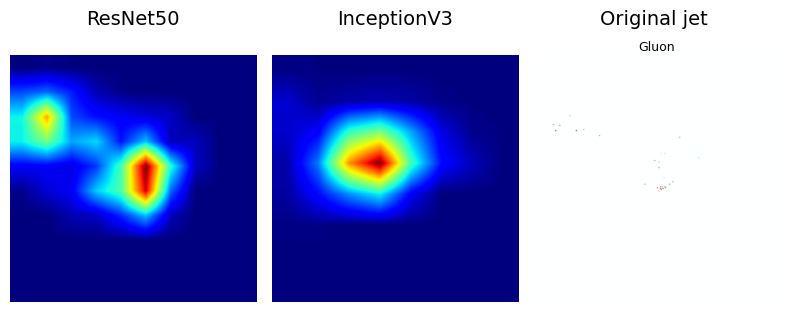

Jet gluon #2 (test_set idx=8): ResNet50 pred=Z boson, InceptionV3 pred=Gluon


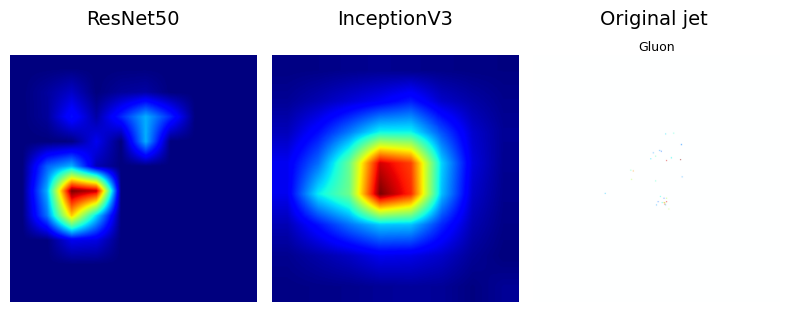

Jet gluon #3 (test_set idx=11): ResNet50 pred=Gluon, InceptionV3 pred=Gluon


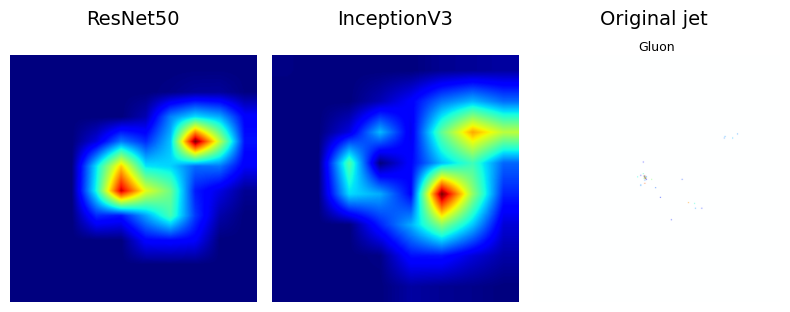

Jet gluon #4 (test_set idx=15): ResNet50 pred=Gluon, InceptionV3 pred=Gluon


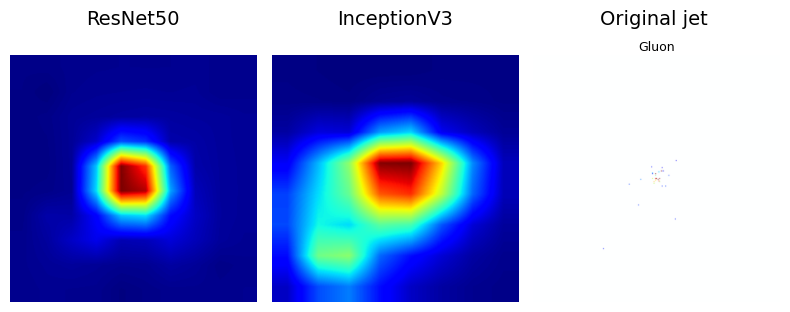

Jet gluon #5 (test_set idx=21): ResNet50 pred=Light Quark, InceptionV3 pred=Gluon


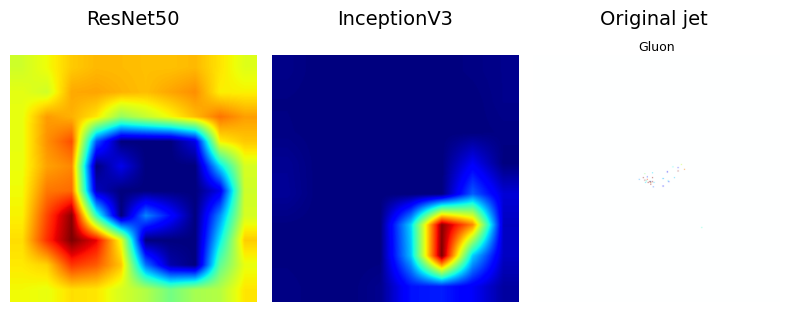

Jet gluon #6 (test_set idx=24): ResNet50 pred=Light Quark, InceptionV3 pred=Gluon


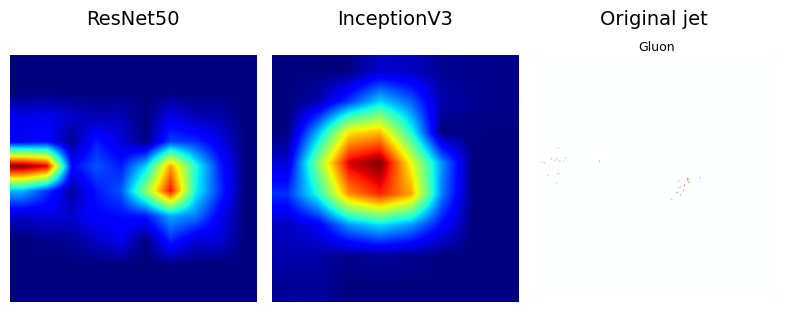

Jet gluon #7 (test_set idx=25): ResNet50 pred=Light Quark, InceptionV3 pred=Gluon


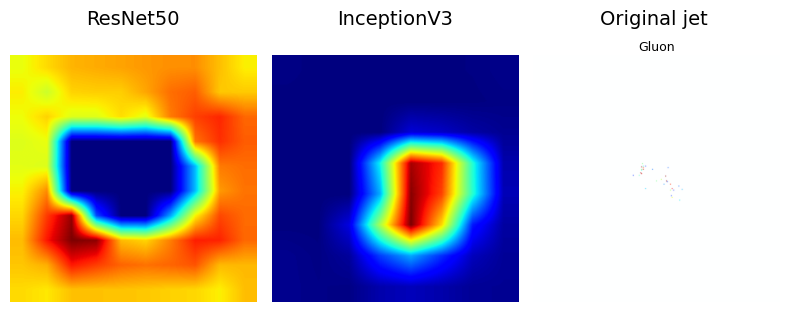

Jet gluon #8 (test_set idx=28): ResNet50 pred=Gluon, InceptionV3 pred=Gluon


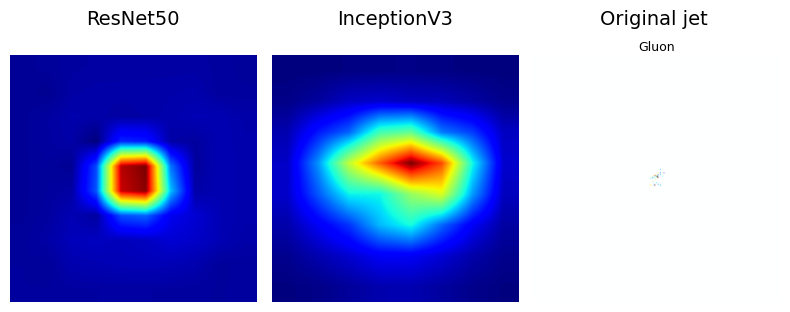

Jet gluon #9 (test_set idx=33): ResNet50 pred=Gluon, InceptionV3 pred=Gluon


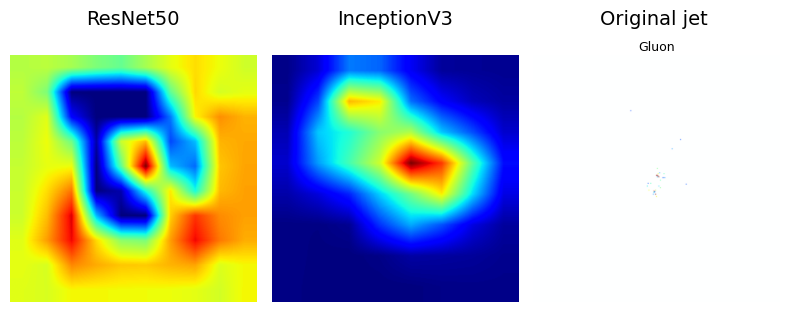

Jet gluon #10 (test_set idx=46): ResNet50 pred=Top Quark, InceptionV3 pred=Gluon


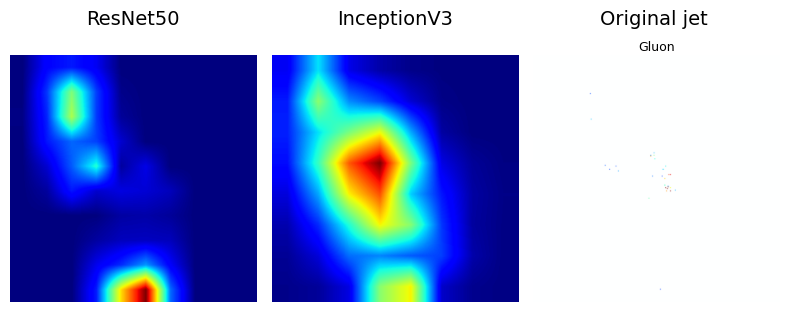

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the directory where the Jet images are stored
data_dir = './data2/JetNet/Jet2Image_5types_170k'  # Change this path if your dataset is in a different location

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet = model_resnet.to(device)
model_incept = model_incept.to(device)

train_val_set, test_set = load_jet_images(data_dir)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
def denormalize(img, mean, std):
    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

class_names = ["Gluon", "Light Quark", "Top Quark", "W boson", "Z boson"]

# GradCAM 
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))
    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if isinstance(output, tuple):
            features = output[0]
        else:
            features = output
        if class_idx is None:
            class_idx = features.argmax(dim=1).item()
        loss = features[0, class_idx]
        loss.backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        grad_cam_map = (weights * self.activations).sum(dim=1, keepdim=True)
        grad_cam_map = torch.nn.functional.relu(grad_cam_map)
        grad_cam_map = torch.nn.functional.interpolate(
            grad_cam_map, size=input_tensor.shape[2:], mode='bilinear', align_corners=False
        )
        grad_cam_map = grad_cam_map[0, 0].cpu().numpy()
        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() if grad_cam_map.max() > 0 else 1
        return grad_cam_map
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# Target layers for GradCAM
target_layer_resnet = model_resnet.layer4[-1] if hasattr(model_resnet, "layer4") else model_resnet.resnet50.layer4[-1]
target_layer_inception = model_incept.Mixed_7c if hasattr(model_incept, "Mixed_7c") else model_incept.inceptionv3.Mixed_7c

grad_cam_resnet = GradCAM(model_resnet, target_layer_resnet)
grad_cam_inception = GradCAM(model_incept, target_layer_inception)

# Choose 10 g-jets from test_set 
gluon_indices = []
for idx in range(len(test_set)):
    _, label = test_set[idx]
    if label == 0:
        gluon_indices.append(idx)
    if len(gluon_indices) == 10:
        break

if len(gluon_indices) < 10:
    print(f"Solo se encontraron {len(gluon_indices)} jets de gluon en el test set.")

main_dir = 'HM_models'
os.makedirs(main_dir, exist_ok =True)

for i, idx in enumerate(gluon_indices):
    img_tensor, label_true = test_set[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    img_vis = denormalize(img_tensor, mean, std)

    # RESNET50
    logits_resnet = model_resnet(input_tensor)
    if isinstance(logits_resnet, tuple):
        logits_resnet = logits_resnet[0]
    pred_class_resnet = logits_resnet.argmax(dim=1).item()

    # INCEPTIONV3
    logits_incept = model_incept(input_tensor)
    if isinstance(logits_incept, tuple):
        logits_incept = logits_incept[0]
    pred_class_incept = logits_incept.argmax(dim=1).item()

    heatmap_resnet = grad_cam_resnet.generate(input_tensor, class_idx=0)
    heatmap_inception = grad_cam_inception.generate(input_tensor, class_idx=0)

    print(f"Jet gluon #{i+1} (test_set idx={idx}): ResNet50 pred={class_names[pred_class_resnet]}, InceptionV3 pred={class_names[pred_class_incept]}")

    # Create a fold
    folder = os.path.join(main_dir, f"jet_gluon_{idx}")
    os.makedirs(folder, exist_ok=True)


    # Visualization
    plt.figure(figsize=(8, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(img_vis)
    plt.imshow(heatmap_resnet, cmap='jet', vmin=0, vmax=1)
    plt.title(f"ResNet50\n", fontsize = 14)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_vis)
    plt.imshow(heatmap_inception, cmap='jet', vmin=0, vmax=1)
    plt.title(f"InceptionV3\n", fontsize = 14)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_vis)
    plt.title(
        f"Original jet \n " , fontsize = 14)
    plt.text(
        0.5, 1.01,
    class_names[label_true],
    ha='center', va='bottom', fontsize=9, transform=plt.gca().transAxes
)
    plt.axis('off')

    plt.tight_layout()
    
    plt.savefig(
        os.path.join(folder, f"heatmap_true{label_true}_jet{idx}.png"),
        bbox_inches='tight', pad_inches=0.05
    )

    plt.show()
    plt.close()

grad_cam_resnet.remove_hooks()
grad_cam_inception.remove_hooks()


#### Heat-maps for Light Quark

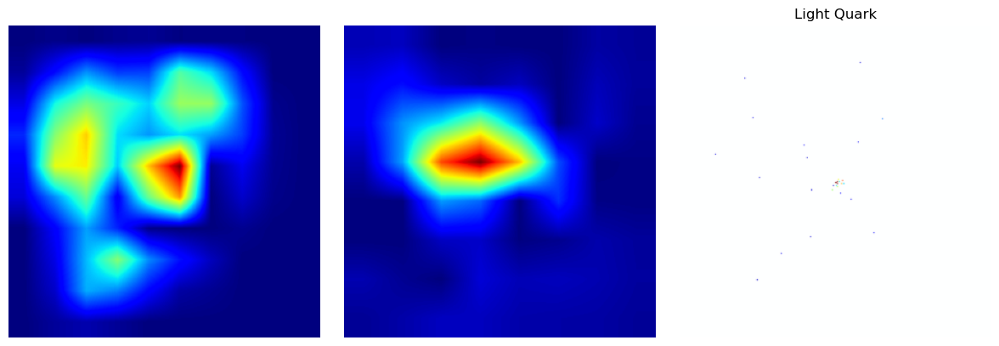

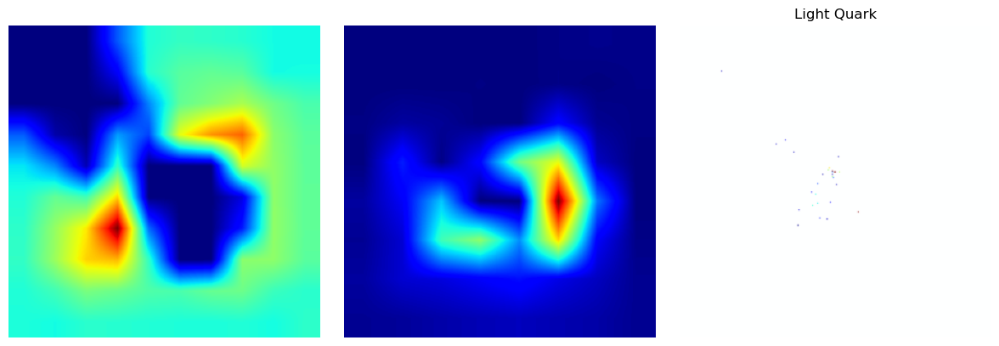

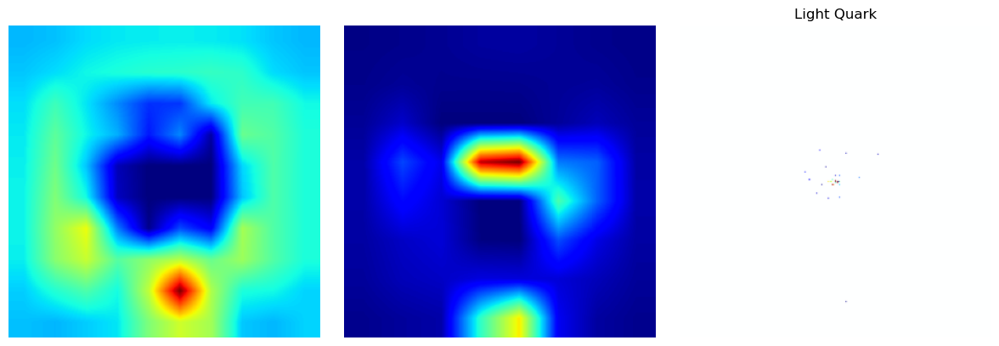

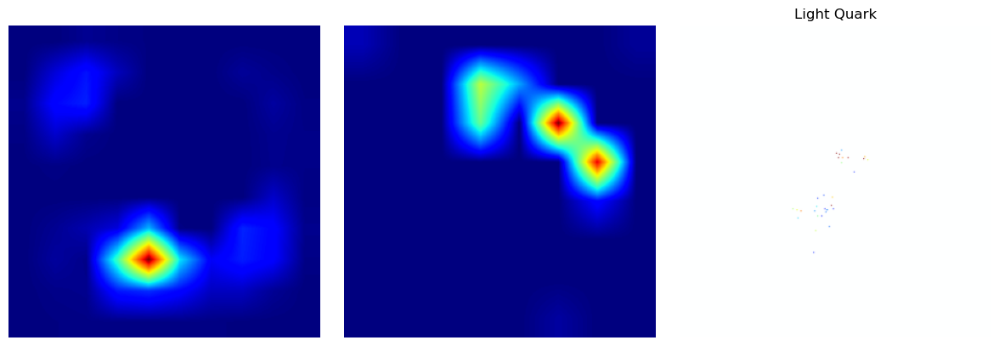

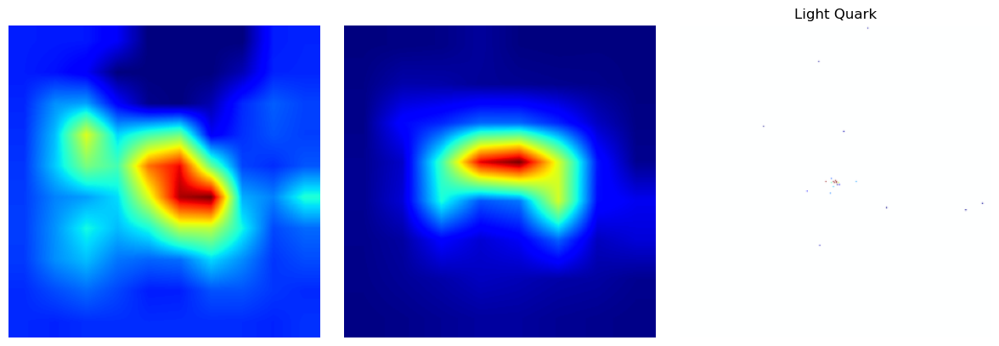

...

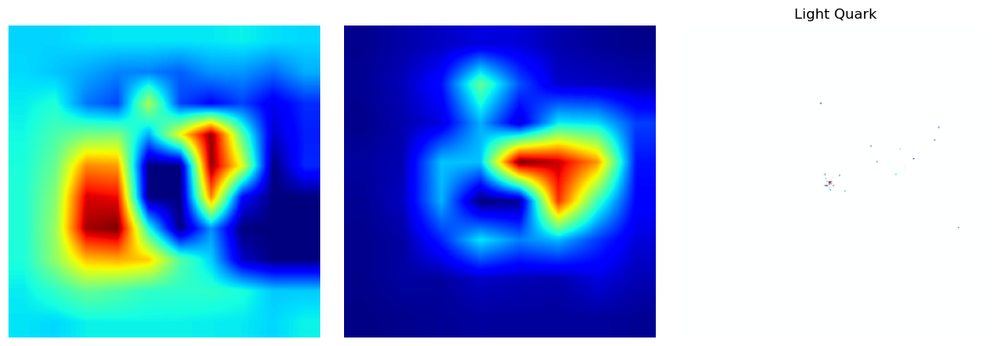

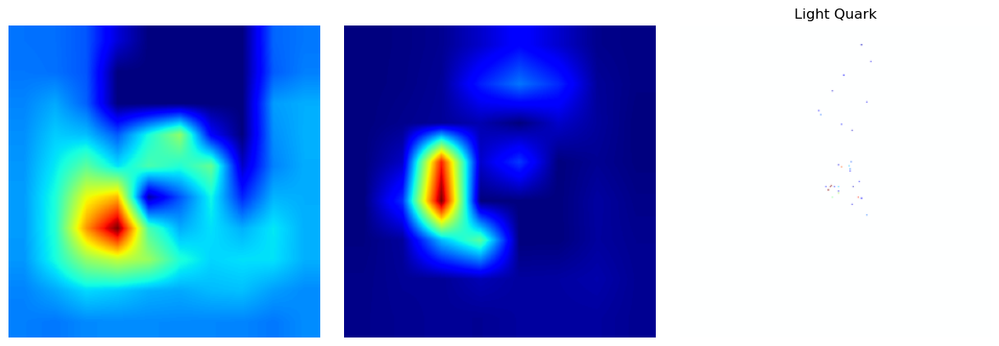

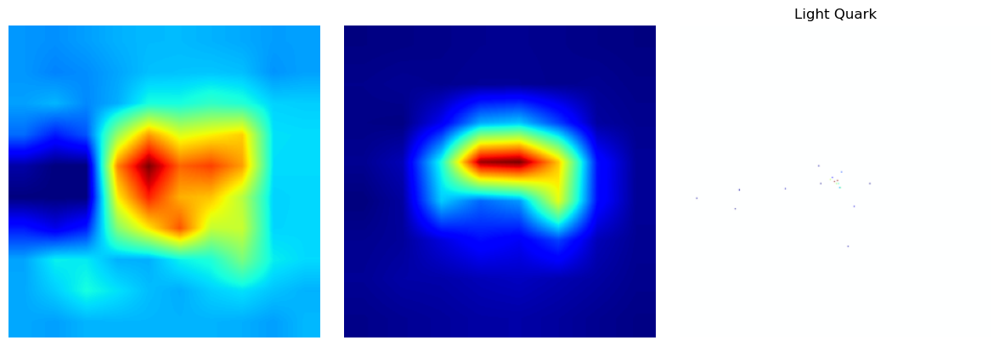

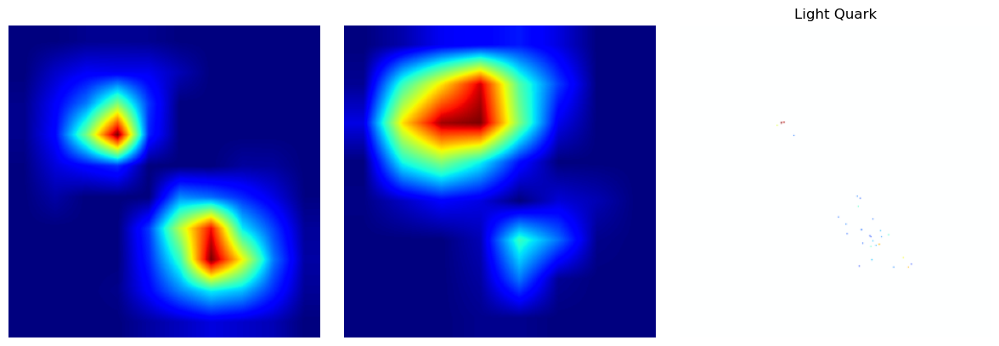

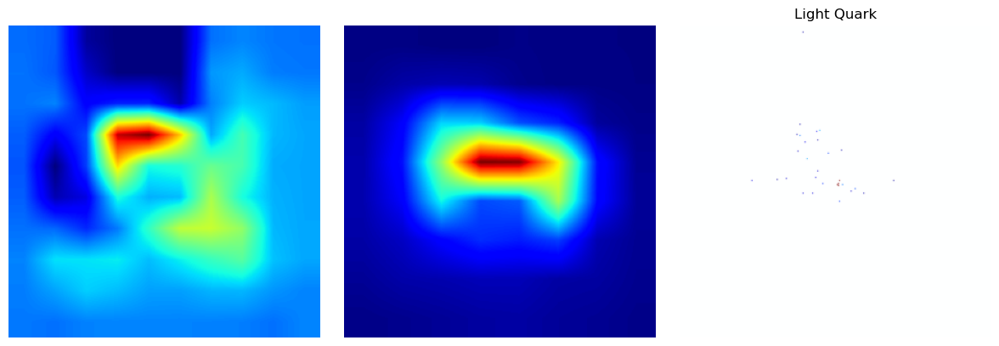

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet = model_resnet.to(device)
model_incept = model_incept.to(device)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
def denormalize(img, mean, std):
    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

class_names = ["Gluon", "Light Quark", "Top Quark", "W boson", "Z boson"]

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))
    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if isinstance(output, tuple):
            features = output[0]
        else:
            features = output
        if class_idx is None:
            class_idx = features.argmax(dim=1).item()
        loss = features[0, class_idx]
        loss.backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        grad_cam_map = (weights * self.activations).sum(dim=1, keepdim=True)
        grad_cam_map = torch.nn.functional.relu(grad_cam_map)
        grad_cam_map = torch.nn.functional.interpolate(
            grad_cam_map, size=input_tensor.shape[2:], mode='bilinear', align_corners=False
        )
        grad_cam_map = grad_cam_map[0, 0].cpu().numpy()
        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() if grad_cam_map.max() > 0 else 1
        return grad_cam_map
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# Target layers for GradCAM
target_layer_resnet = model_resnet.layer4[-1] if hasattr(model_resnet, "layer4") else model_resnet.resnet50.layer4[-1]
target_layer_inception = model_incept.Mixed_7c if hasattr(model_incept, "Mixed_7c") else model_incept.inceptionv3.Mixed_7c

grad_cam_resnet = GradCAM(model_resnet, target_layer_resnet)
grad_cam_inception = GradCAM(model_incept, target_layer_inception)

#main_dir = "q-jet_heat-map"
os.makedirs(main_dir, exist_ok=True)

# Choose randomly 10 q-jets from test_set
num_jets = 10
perm = np.random.permutation(500)


lightq_indices = []
for idx in perm:
    _, label = test_set[idx]
    if label == 1:
        lightq_indices.append(idx)
    if len(lightq_indices) == num_jets:
        break

if len(lightq_indices) < num_jets:
    print(f"Solo se encontraron {len(lightq_indices)} jets de Light Quark en el test set.")

for i, idx in enumerate(lightq_indices):
    img_tensor, label_true = test_set[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    img_vis = denormalize(img_tensor, mean, std)

    # RESNET50
    logits_resnet = model_resnet(input_tensor)
    if isinstance(logits_resnet, tuple):
        logits_resnet = logits_resnet[0]
    pred_class_resnet = logits_resnet.argmax(dim=1).item()
    heatmap_resnet = grad_cam_resnet.generate(input_tensor, class_idx=1)

    # INCEPTIONV3
    logits_incept = model_incept(input_tensor)
    if isinstance(logits_incept, tuple):
        logits_incept = logits_incept[0]
    pred_class_incept = logits_incept.argmax(dim=1).item()
    heatmap_inception = grad_cam_inception.generate(input_tensor, class_idx=1)

    # Create a folder
    folder = os.path.join(main_dir, f"jet_light_quark_{idx}")
    os.makedirs(folder, exist_ok=True)
    
    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_vis)
    plt.imshow(heatmap_resnet, cmap='jet', vmin=0, vmax=1)
    plt.title(f"ResNet50 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_resnet]})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_vis)
    plt.imshow(heatmap_inception, cmap='jet', vmin=0, vmax=1)
    plt.title(f"InceptionV3 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_incept]})")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_vis)
    plt.title(f"{class_names[label_true]}")
    plt.axis('off')

    plt.tight_layout()
    
    plt.savefig(
        os.path.join(folder, f"heatmap_true{label_true}_jet{idx}.png"),
        bbox_inches='tight', pad_inches=0.05
    )

    plt.show()
    plt.close()


grad_cam_resnet.remove_hooks()
grad_cam_inception.remove_hooks()


#### Heat-maps for Top Quark

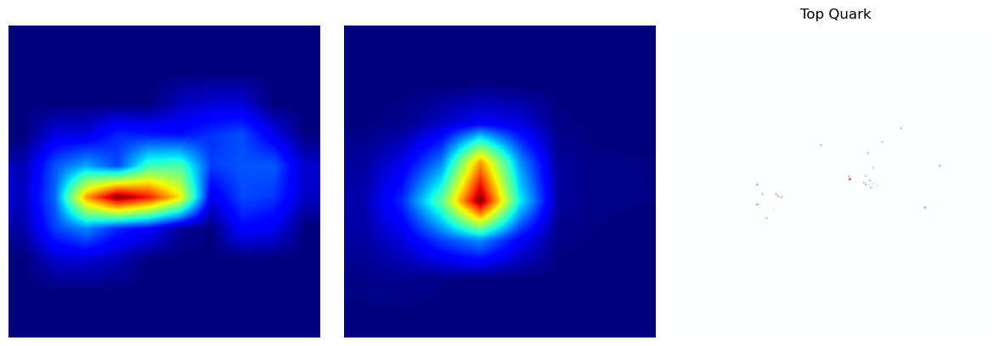

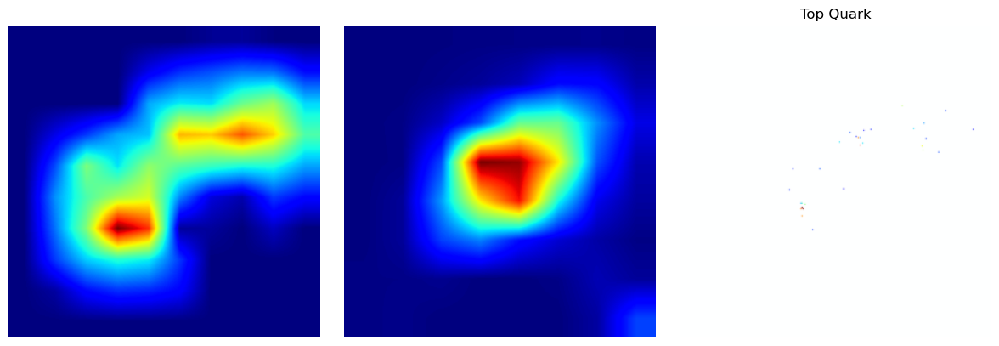

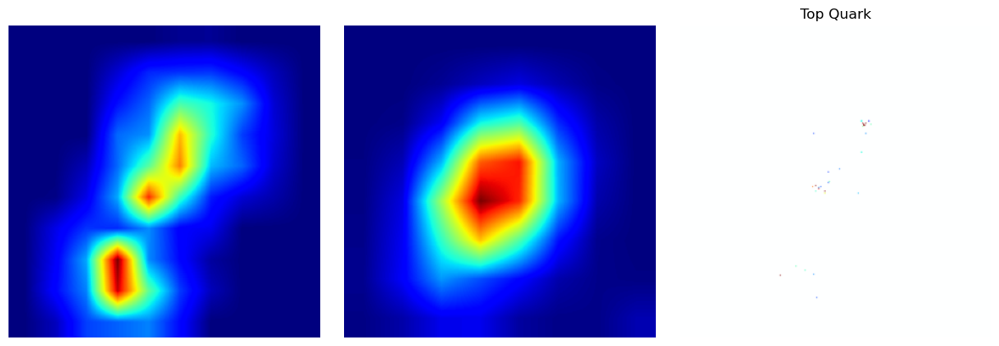

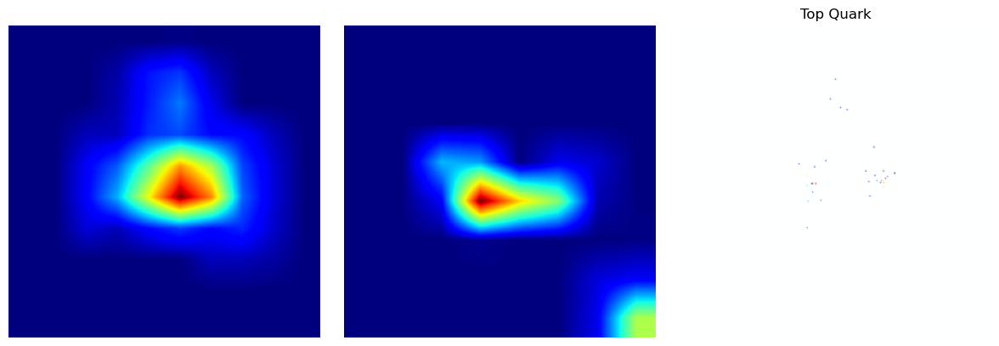

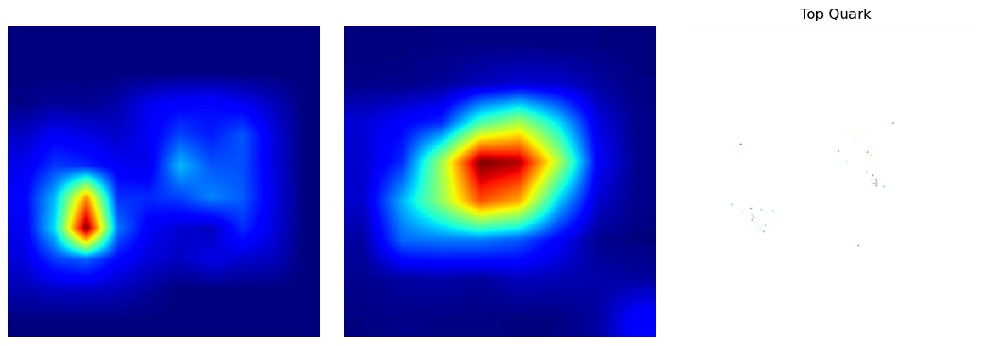

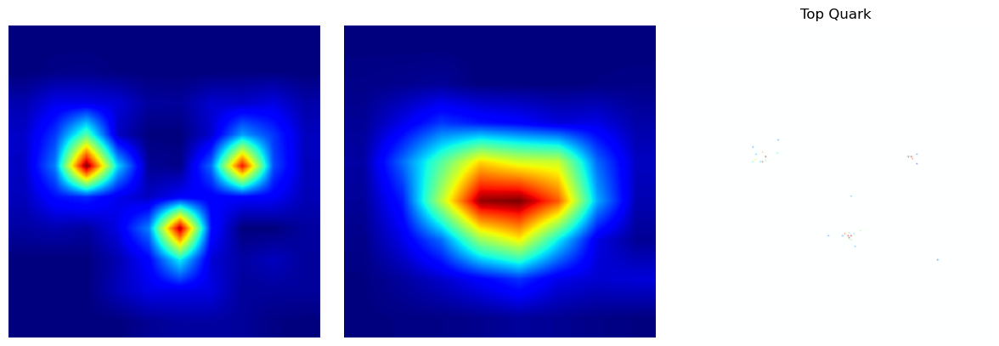

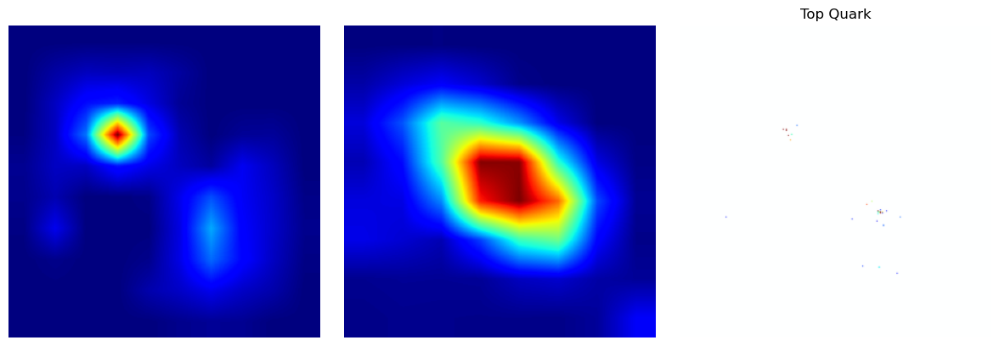

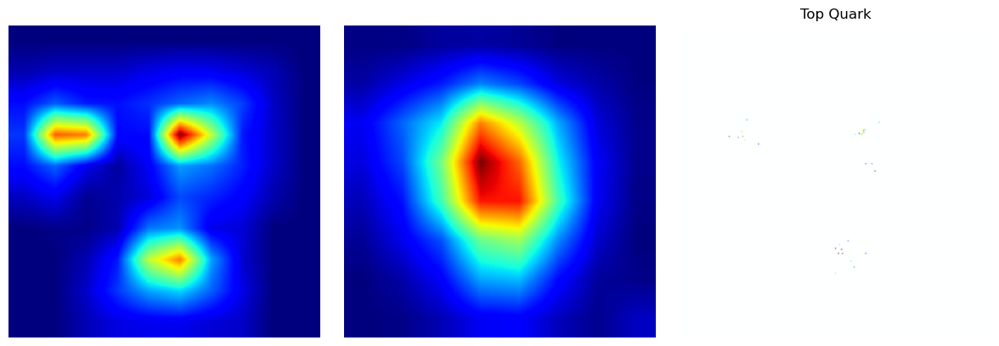

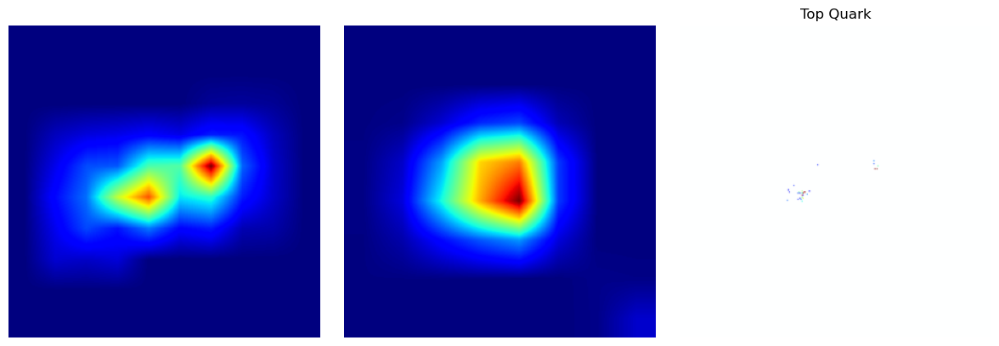

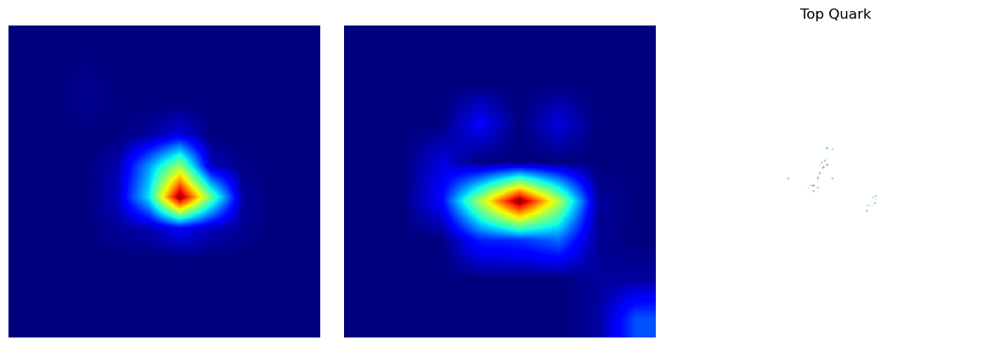

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet = model_resnet.to(device)
model_incept = model_incept.to(device)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
def denormalize(img, mean, std):
    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

class_names = ["Gluon", "Light Quark", "Top Quark", "W boson", "Z boson"]

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))
    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if isinstance(output, tuple):
            features = output[0]
        else:
            features = output
        if class_idx is None:
            class_idx = features.argmax(dim=1).item()
        loss = features[0, class_idx]
        loss.backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        grad_cam_map = (weights * self.activations).sum(dim=1, keepdim=True)
        grad_cam_map = torch.nn.functional.relu(grad_cam_map)
        grad_cam_map = torch.nn.functional.interpolate(
            grad_cam_map, size=input_tensor.shape[2:], mode='bilinear', align_corners=False
        )
        grad_cam_map = grad_cam_map[0, 0].cpu().numpy()
        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() if grad_cam_map.max() > 0 else 1
        return grad_cam_map
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# Target layers for GradCAM
target_layer_resnet = model_resnet.layer4[-1] if hasattr(model_resnet, "layer4") else model_resnet.resnet50.layer4[-1]
target_layer_inception = model_incept.Mixed_7c if hasattr(model_incept, "Mixed_7c") else model_incept.inceptionv3.Mixed_7c

grad_cam_resnet = GradCAM(model_resnet, target_layer_resnet)
grad_cam_inception = GradCAM(model_incept, target_layer_inception)

#main_dir = "Heat_maps_t-jet"
os.makedirs(main_dir, exist_ok=True)

# Choose 10 t-jets (Top Quark) from test_set ---
topq_indices = []
for idx in range(len(test_set)):
    _, label = test_set[idx]
    if label == 2:
        topq_indices.append(idx)
    if len(topq_indices) == 10:
        break

if len(topq_indices) < 10:
    print(f"Solo se encontraron {len(topq_indices)} jets de Top Quark en el test set.")

for i, idx in enumerate(topq_indices):
    img_tensor, label_true = test_set[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    img_vis = denormalize(img_tensor, mean, std)

    # RESNET50
    logits_resnet = model_resnet(input_tensor)
    if isinstance(logits_resnet, tuple):
        logits_resnet = logits_resnet[0]
    pred_class_resnet = logits_resnet.argmax(dim=1).item()
    heatmap_resnet = grad_cam_resnet.generate(input_tensor, class_idx=2)

    # INCEPTIONV3
    logits_incept = model_incept(input_tensor)
    if isinstance(logits_incept, tuple):
        logits_incept = logits_incept[0]
    pred_class_incept = logits_incept.argmax(dim=1).item()
    heatmap_inception = grad_cam_inception.generate(input_tensor, class_idx=2)

    # Create a folder
    folder = os.path.join(main_dir, f"jet_top_quark_{idx}")
    os.makedirs(folder, exist_ok=True)

    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_vis)
    plt.imshow(heatmap_resnet, cmap='jet', vmin=0, vmax=1)
    plt.title(f"ResNet50 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_resnet]})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_vis)
    plt.imshow(heatmap_inception, cmap='jet', vmin=0, vmax=1)
    plt.title(f"InceptionV3 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_incept]})")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_vis)
    plt.title(f"{class_names[label_true]}")
    plt.axis('off')

    plt.tight_layout()
    
    plt.savefig(
        os.path.join(folder, f"heatmap_true{label_true}_jet{idx}.png"),
        bbox_inches='tight', pad_inches=0.05
    )

    plt.show()
    plt.close()

grad_cam_resnet.remove_hooks()
grad_cam_inception.remove_hooks()


#### Heat-maps for W boson

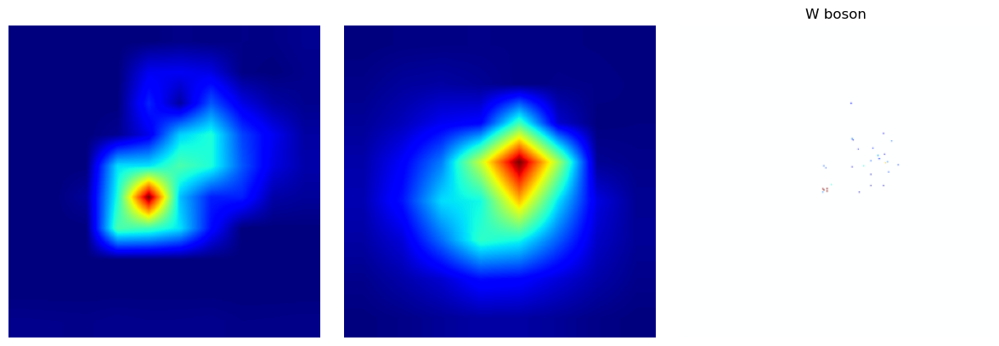

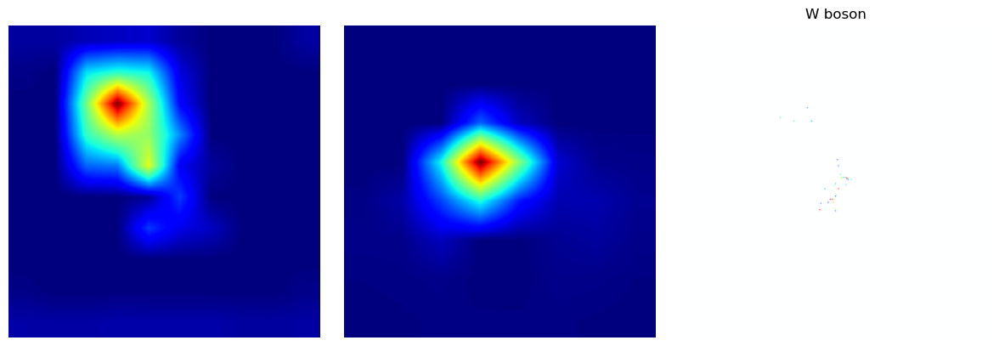

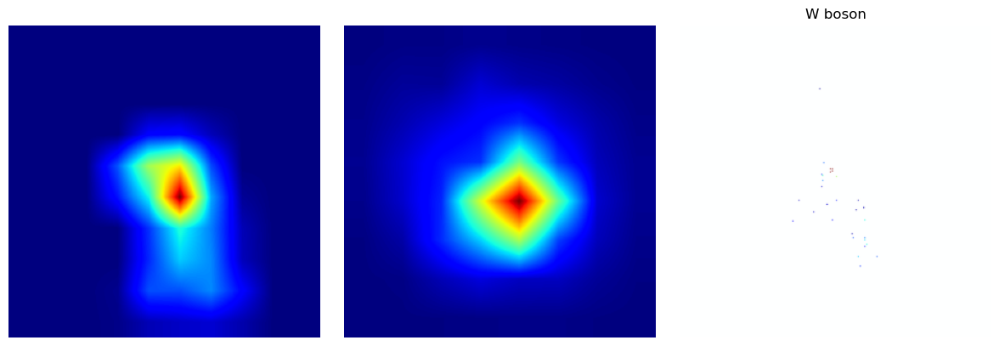

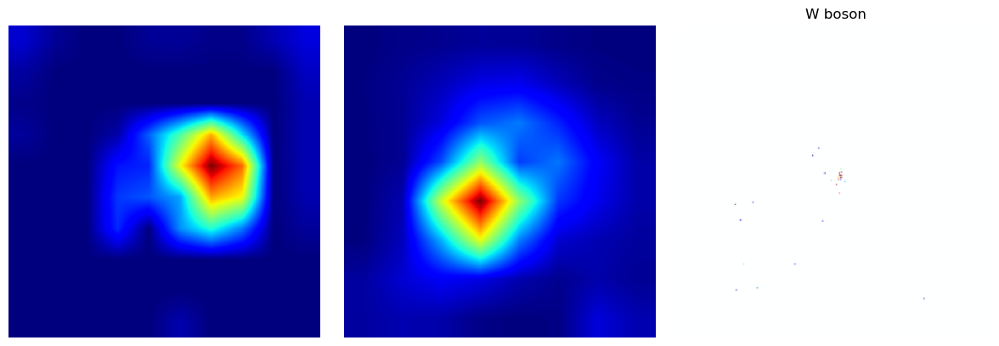

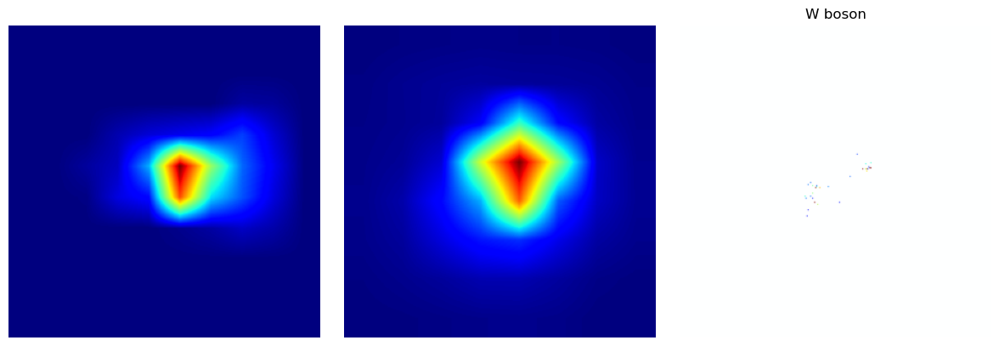

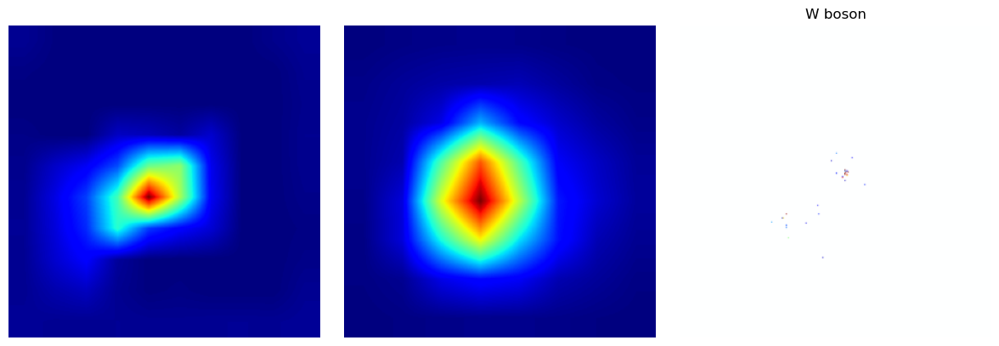

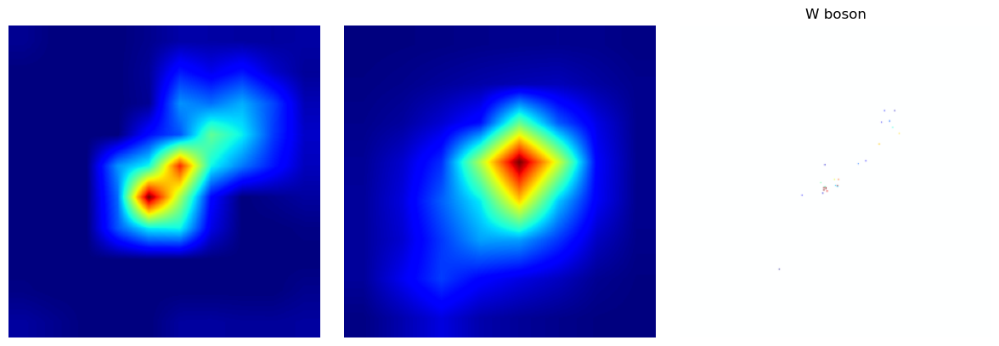

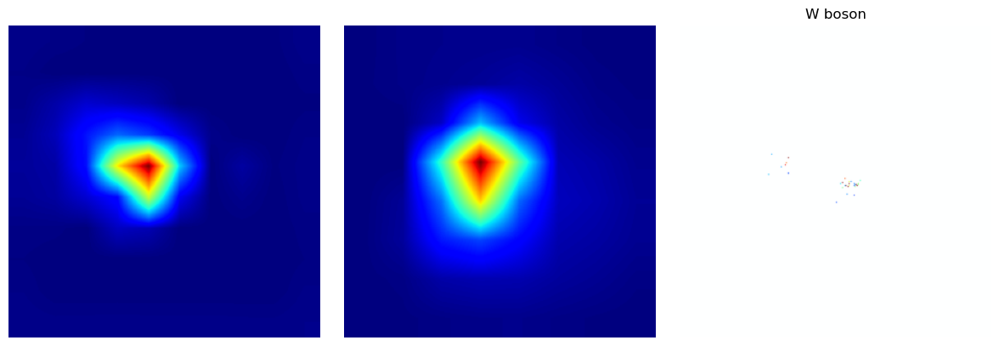

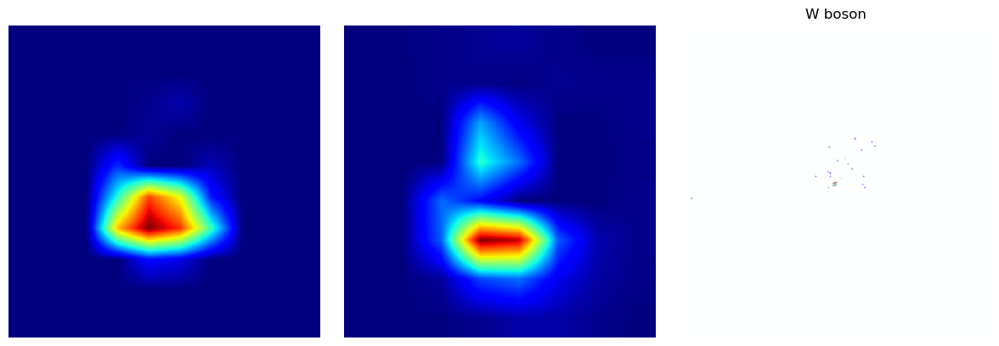

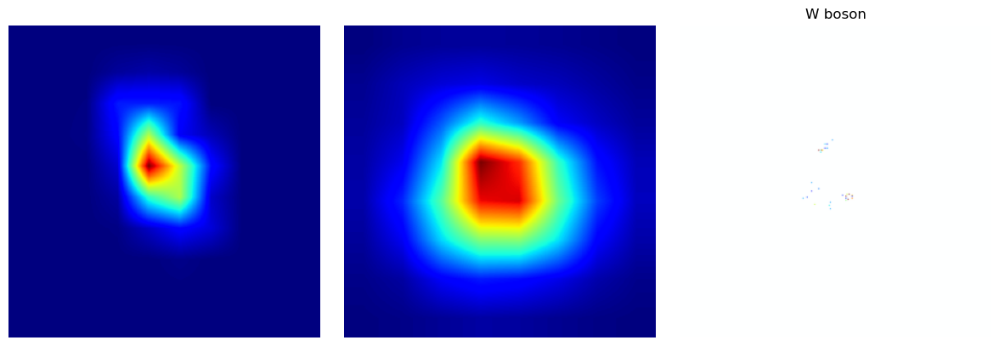

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet = model_resnet.to(device)
model_incept = model_incept.to(device)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
def denormalize(img, mean, std):
    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

class_names = ["Gluon", "Light Quark", "Top Quark", "W boson", "Z boson"]

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))
    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if isinstance(output, tuple):
            features = output[0]
        else:
            features = output
        if class_idx is None:
            class_idx = features.argmax(dim=1).item()
        loss = features[0, class_idx]
        loss.backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        grad_cam_map = (weights * self.activations).sum(dim=1, keepdim=True)
        grad_cam_map = torch.nn.functional.relu(grad_cam_map)
        grad_cam_map = torch.nn.functional.interpolate(
            grad_cam_map, size=input_tensor.shape[2:], mode='bilinear', align_corners=False
        )
        grad_cam_map = grad_cam_map[0, 0].cpu().numpy()
        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() if grad_cam_map.max() > 0 else 1
        return grad_cam_map
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# Target layers for GradCAM
target_layer_resnet = model_resnet.layer4[-1] if hasattr(model_resnet, "layer4") else model_resnet.resnet50.layer4[-1]
target_layer_inception = model_incept.Mixed_7c if hasattr(model_incept, "Mixed_7c") else model_incept.inceptionv3.Mixed_7c

grad_cam_resnet = GradCAM(model_resnet, target_layer_resnet)
grad_cam_inception = GradCAM(model_incept, target_layer_inception)

#main_dir = "Heat_maps_w-jet"
os.makedirs(main_dir, exist_ok=True)

# Choose 10 w-jets (W boson) from test_set ---
wboson_indices = []
for idx in range(len(test_set)):
    _, label = test_set[idx]
    if label == 3:
        wboson_indices.append(idx)
    if len(wboson_indices) == 10:
        break

if len(wboson_indices) < 10:
    print(f"Solo se encontraron {len(wboson_indices)} jets de W boson en el test set.")

for i, idx in enumerate(wboson_indices):
    img_tensor, label_true = test_set[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    img_vis = denormalize(img_tensor, mean, std)

    # RESNET50
    logits_resnet = model_resnet(input_tensor)
    if isinstance(logits_resnet, tuple):
        logits_resnet = logits_resnet[0]
    pred_class_resnet = logits_resnet.argmax(dim=1).item()
    heatmap_resnet = grad_cam_resnet.generate(input_tensor, class_idx=3)

    # INCEPTIONV3
    logits_incept = model_incept(input_tensor)
    if isinstance(logits_incept, tuple):
        logits_incept = logits_incept[0]
    pred_class_incept = logits_incept.argmax(dim=1).item()
    heatmap_inception = grad_cam_inception.generate(input_tensor, class_idx=3)

    # Create a folder
    folder = os.path.join(main_dir, f"jet_w_boson_{idx}")
    os.makedirs(folder, exist_ok=True)

    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_vis)
    plt.imshow(heatmap_resnet, cmap='jet', vmin=0, vmax=1)
    plt.title(f"ResNet50 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_resnet]})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_vis)
    plt.imshow(heatmap_inception, cmap='jet', vmin=0, vmax=1)
    plt.title(f"InceptionV3 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_incept]})")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_vis)
    plt.title(f"{class_names[label_true]}")
    plt.axis('off')

    plt.tight_layout()
    
    plt.savefig(
        os.path.join(folder, f"heatmap_true{label_true}_jet{idx}.png"),
        bbox_inches='tight', pad_inches=0.05
    )

    plt.show()
    plt.close()
   
grad_cam_resnet.remove_hooks()
grad_cam_inception.remove_hooks()


#### Heat-maps for Z boson

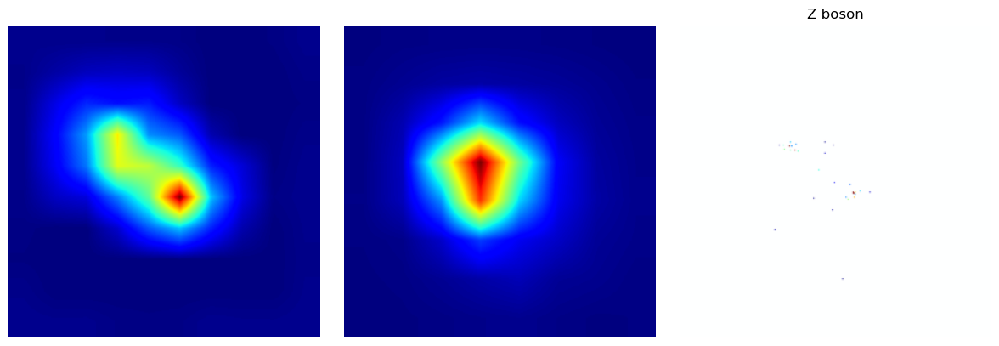

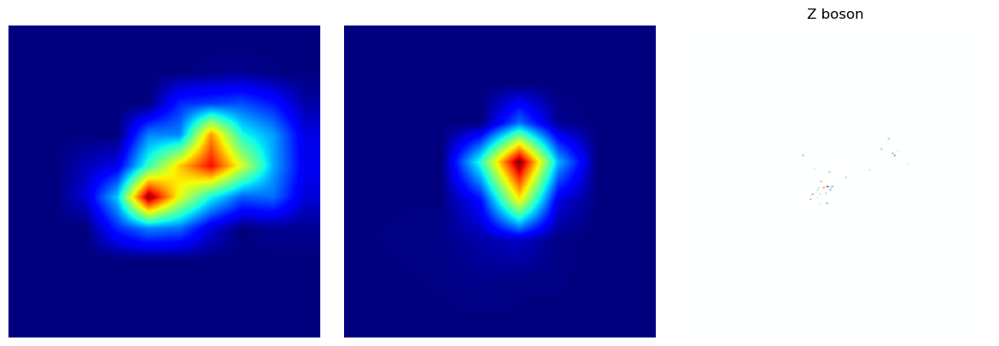

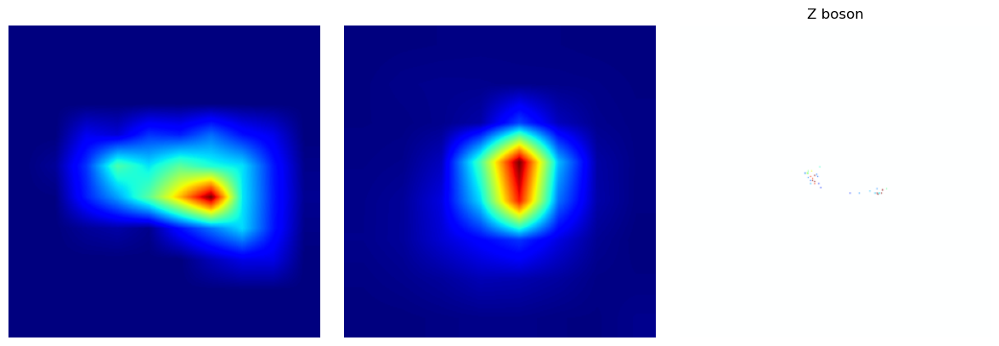

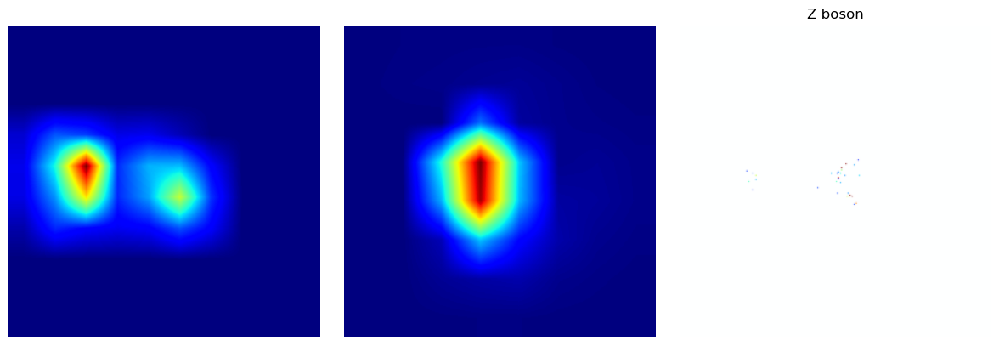

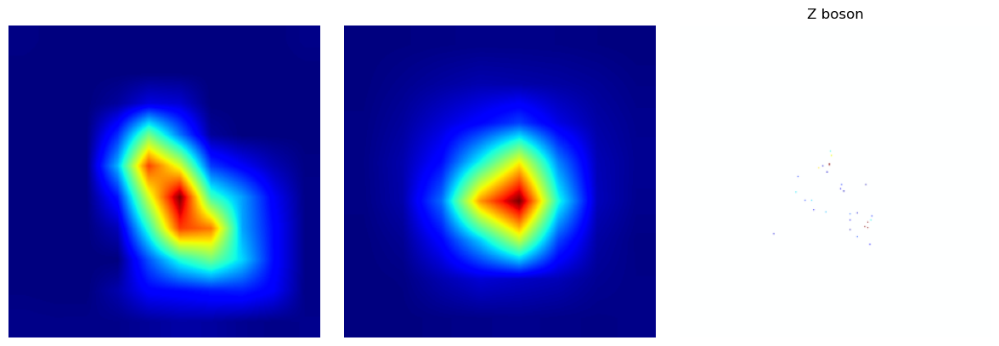

...

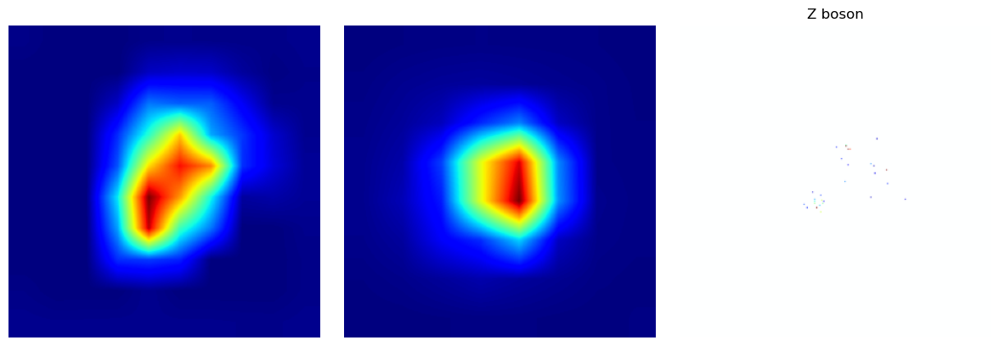

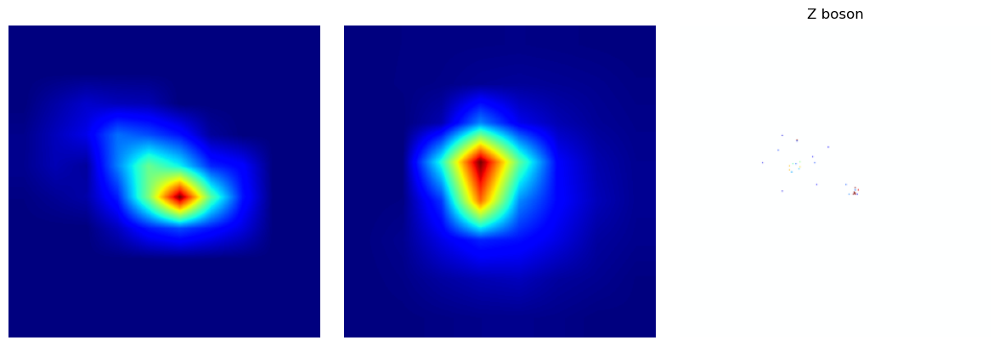

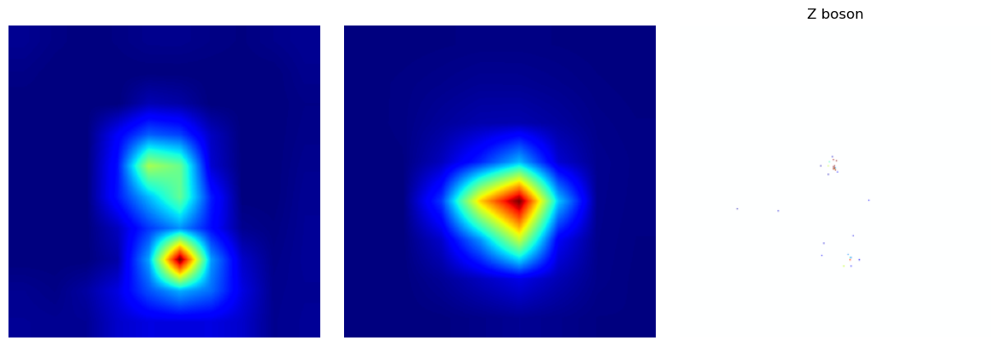

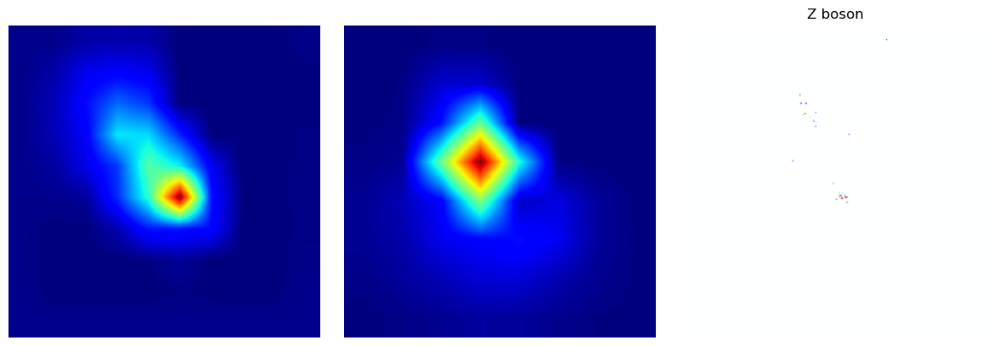

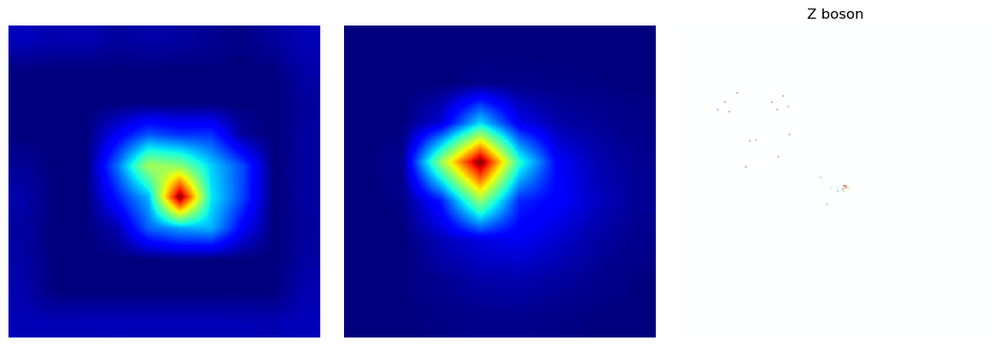

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet = model_resnet.to(device)
model_incept = model_incept.to(device)

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
def denormalize(img, mean, std):
    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

class_names = ["Gluon", "Light Quark", "Top Quark", "W boson", "Z boson"]

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))
    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if isinstance(output, tuple):
            features = output[0]
        else:
            features = output
        if class_idx is None:
            class_idx = features.argmax(dim=1).item()
        loss = features[0, class_idx]
        loss.backward()
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        grad_cam_map = (weights * self.activations).sum(dim=1, keepdim=True)
        grad_cam_map = torch.nn.functional.relu(grad_cam_map)
        grad_cam_map = torch.nn.functional.interpolate(
            grad_cam_map, size=input_tensor.shape[2:], mode='bilinear', align_corners=False
        )
        grad_cam_map = grad_cam_map[0, 0].cpu().numpy()
        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() if grad_cam_map.max() > 0 else 1
        return grad_cam_map
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# Target layers for GradCAM
target_layer_resnet = model_resnet.layer4[-1] if hasattr(model_resnet, "layer4") else model_resnet.resnet50.layer4[-1]
target_layer_inception = model_incept.Mixed_7c if hasattr(model_incept, "Mixed_7c") else model_incept.inceptionv3.Mixed_7c

grad_cam_resnet = GradCAM(model_resnet, target_layer_resnet)
grad_cam_inception = GradCAM(model_incept, target_layer_inception)

#main_dir = "Heat_maps_z-jet"
os.makedirs(main_dir, exist_ok=True)

# Chosse 10 z-jets (Z boson) from test_set ---
zboson_indices = []
for idx in range(len(test_set)):
    _, label = test_set[idx]
    if label == 4:
        zboson_indices.append(idx)
    if len(zboson_indices) == 30:
        break

if len(zboson_indices) < 30:
    print(f"Solo se encontraron {len(zboson_indices)} jets de Z boson en el test set.")

for i, idx in enumerate(zboson_indices):
    img_tensor, label_true = test_set[idx]
    input_tensor = img_tensor.unsqueeze(0).to(device)
    img_vis = denormalize(img_tensor, mean, std)

    # RESNET50
    logits_resnet = model_resnet(input_tensor)
    if isinstance(logits_resnet, tuple):
        logits_resnet = logits_resnet[0]
    pred_class_resnet = logits_resnet.argmax(dim=1).item()
    heatmap_resnet = grad_cam_resnet.generate(input_tensor, class_idx=4)

    # INCEPTIONV3
    logits_incept = model_incept(input_tensor)
    if isinstance(logits_incept, tuple):
        logits_incept = logits_incept[0]
    pred_class_incept = logits_incept.argmax(dim=1).item()
    heatmap_inception = grad_cam_inception.generate(input_tensor, class_idx=4)

    # Create a folder
    folder = os.path.join(main_dir, f"jet_z_boson_{idx}")
    os.makedirs(folder, exist_ok=True)

    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_vis)
    plt.imshow(heatmap_resnet, cmap='jet', vmin=0, vmax=1)
    plt.title(f"ResNet50 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_resnet]})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_vis)
    plt.imshow(heatmap_inception, cmap='jet', vmin=0, vmax=1)
    plt.title(f"InceptionV3 Heatmap\n(True:{class_names[label_true]} Pred:{class_names[pred_class_incept]})")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_vis)
    plt.title(f"{class_names[label_true]}")
    plt.axis('off')

    plt.tight_layout()
    
    plt.savefig(
        os.path.join(folder, f"heatmap_true{label_true}_jet{idx}.png"),
        bbox_inches='tight', pad_inches=0.05
    )

    plt.show()
    plt.close()

grad_cam_resnet.remove_hooks()
grad_cam_inception.remove_hooks()
